In [1]:
import time
from tqdm import tqdm
from pathlib import WindowsPath

import cv2
import random
import numpy as np
import SimpleITK as sitk
from PIL import Image, ImageFilter

import skimage.io as sio
from skimage.measure import label
from skimage.color import label2rgb
from skimage.exposure import rescale_intensity
from skimage.filters import threshold_otsu, gaussian
from skimage.segmentation import watershed, expand_labels, find_boundaries, clear_border
from skimage.morphology import disk, erosion, dilation, closing, \
    binary_dilation, binary_erosion, binary_closing, remove_small_objects, convex_hull_image


from cellpaint.steps_single_plate._segmentation import SegmentationPartI, SegmentationPartII
from cellpaint.steps_single_plate.step0_args import Args, \
    load_img, sort_key_for_imgs, get_img_channel_groups, set_mask_save_name


import torch
from cellpose import models
import pyclesperanto_prototype as cle
import matplotlib.pyplot as plt
# %matplotlib qt

C:\Users\u243254\.conda\envs\tensors\lib\site-packages\pyclesperanto_prototype\_tier0\_device.py:77: UserWarning: No OpenCL device found with RTX in their name. Using Tesla V100-PCIE-32GB instead.
  warnings.warn(f"No OpenCL device found with {name} in their name. Using {device.name} instead.")


In [2]:
# path to where the data is
camii_server_flav = r"D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114"
# which experiment
exp_fold = "20231115-ATSDR42-Plate1"
main_path = WindowsPath(camii_server_flav)
args = Args(experiment=exp_fold, main_path=main_path, mode="preview").args
# print(args)

self.args.imgs_fold: AssayPlate_PerkinElmer_CellCarrier-384
anchor treatment: dmso   anchor cell-line: u2os   anchor density: 2000   anchor dosage: 10   anchor other: 0
control_treatments:  ['dmso']


In [3]:
def get_wellid(x, args):
    return sort_key_for_imgs(x, "to_get_well_id", args.plate_protocol)

# change the default arguments to your custom arguments
def set_custom_datasets_hyperparameters(args):
    ##############################################################################
    # intensity rescaling hyperparameters
    args.w1_intensity_bounds = (5, 99.95)
    args.w2_intensity_bounds = (5, 99.95)
    args.w3_intensity_bounds = (5, 99.95)
    args.w4_intensity_bounds = (5, 99.95)
    args.w5_intensity_bounds = (5, 99.95)
    ##########################################################################
    # background correction hyperparameters
    # Set args.bg_sub to True first,
    # if you decide to do background subtraction.
    args.bg_sub = False
    args.w1_bg_rad = 50
    args.w2_bg_rad = 100
    args.w3_bg_rad = 50
    args.w4_bg_rad = 100
    args.w5_bg_rad = 100
    #######################################################################
    # image channels order/index 
    # defined during data acquisition set by the investigator/microscope
    args.nucleus_idx = 0
    args.cyto_idx = 1
    args.nucleoli_idx = 2
    args.actin_idx = 3
    args.mito_idx = 4
    #######################################################################
    # hyperparameters/constants used in Cellpaint Step 2
    #options for args.step2_segmentation_algorithm are:
        # 1) "w1=cellpose_w2=cellpose"
        # 2) "w1=pycle_w2=pycle"
        # 3) "w1=cellpose_w2=pycle"
        # 4) "w1=pycle_w2=cellpose"
    args.step2_segmentation_algorithm = "w1=cellpose_w2=cellpose"
    args.cellpose_nucleus_diam = 20
    args.cellpose_cyto_diam = 75
    args.cellpose_batch_size = 64
    args.cellpose_model_type = "cyto2"
    # define the minimum size of segmented objects in each channel
    args.w1_min_size = 400
    args.w2_min_size = 700
    args.w3_min_size = 40
    args.w5_min_size = 200
    #######################################################
    # hyperparameters/constants used in Cellpaint Step 3
    ############################################
    # args.multi_nucleus_dist_thresh decides 
    # whether to break down a multi-nucleus cyto mask,
    # into individual cyto masks,
    # based on avg-pairwise distance of all the nucleus
    # inside that cytoplasm
    args.multi_nucleus_dist_thresh = 40
    #######################################
    args.min_nucleoli_size_multiplier = .005
    args.max_nucleoli_size_multiplier = .3
    args.nucleoli_bd_area_to_nucleoli_area_threshold = .2
    args.w3_local_rescale_intensity_ub = 99.2
    args.w5_local_rescale_intensity_ub = 99.9
    return args

In [4]:
# update args
args = set_custom_datasets_hyperparameters(args)

In [5]:
# choose your sample wells from the plate
sample_wellids = ["B15"]
# restrict it to a few images
args.img_filepaths = sorted(filter(
    lambda x: np.isin(get_wellid(x, args), sample_wellids), args.img_filepaths))
args.img_filename_keys, args.img_channels_filepaths, args.N = get_img_channel_groups(args)
print(args.N)
print(args.img_filepaths)

6
[WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A01Z01C01.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A02Z01C02.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A03Z01C03.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A04Z01C05.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_

In [6]:
# choose an idx  (index)
idx = 0
# get the path to the 5 channels as a list 
print(args.img_channels_filepaths)
img_group = args.img_channels_filepaths[idx]
# get keys
filename_key = args.img_filename_keys[idx]
exp_id, well_id, fov = filename_key[0], filename_key[1], filename_key[2]
# load the 5 channel image
img = load_img(img_group, args)

[[WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A01Z01C01.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A02Z01C02.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A03Z01C03.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_CV8000/Cell Painting/Need to be Analyzed/Screens 20231114/20231115-ATSDR42-Plate1/AssayPlate_PerkinElmer_CellCarrier-384/AssayPlate_PerkinElmer_CellCarrier-384_B15_T0001F001L01A04Z01C05.tif'), WindowsPath('D:/DATASTORE/IMAGEDATA/Yokogawa_C

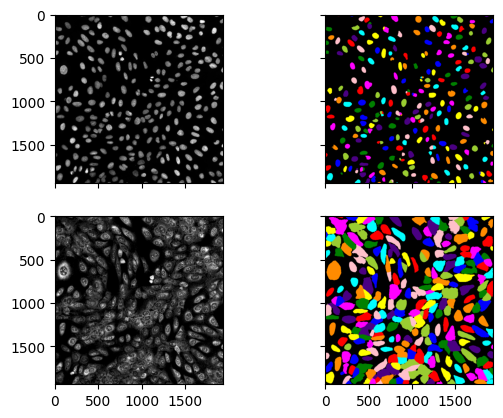

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
Time taken 15.89834189414978 seconds.


In [13]:
# run segmentation step 1 to get nucleus mask and cytoplasm mask
starting_time1 = time.time()

cellpaint_segmentation_step1 = SegmentationPartI(args)
w1_mask, w2_mask = cellpaint_segmentation_step1.get_cellpose_masks(
    img_group, filename_key)
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True)
axes[0, 0].imshow(img[0], cmap="gray")
axes[0, 1].imshow(label2rgb(w1_mask, bg_label=0), cmap="gray")
axes[1, 0].imshow(img[1], cmap="gray")
axes[1, 1].imshow(label2rgb(w2_mask, bg_label=0), cmap="gray")
# axes[2, 0].axis("off")

plt.show()

print(type(img[0]))
print(type(label2rgb(w1_mask,bg_label=0)))

cv2.imwrite(r'D:\DATASTORE\IMAGEDATA\Yokogawa_CV8000\Cell Painting\Testing Folder\20231206-test-RGB\fileWagon.tif',label2rgb(w1_mask,bg_label=0))

print(f'Time taken {time.time() - starting_time1} seconds.')

w1=cellpose_w2=cellpose
end_line


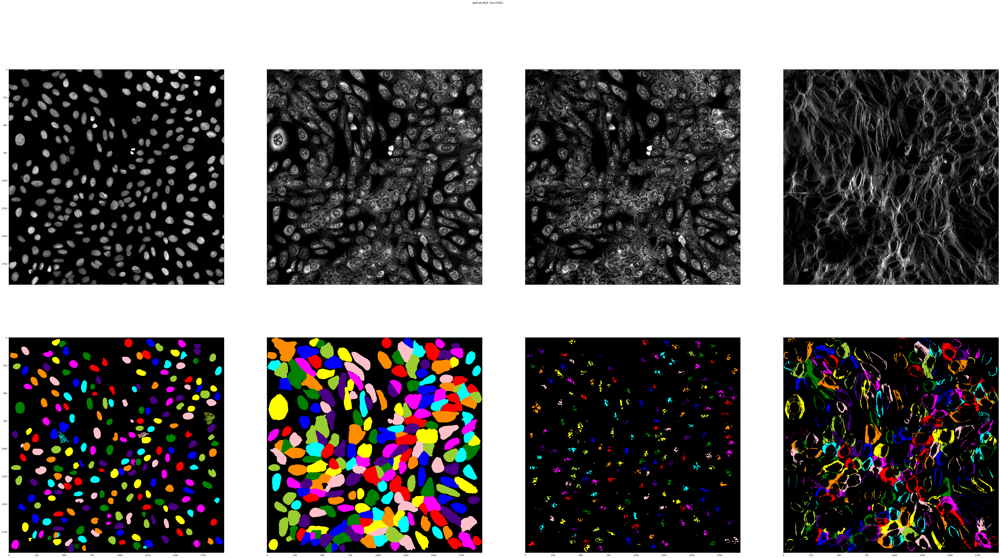

Time taken 41.00929355621338 seconds.


In [10]:
# run segmentation step 2 to match cytoplasm and nucleus and masks, as well as,
# segment nucleoli and mitocondria masks
starting_time2 = time.time()

print(args.step2_segmentation_algorithm)

cellpaint_segmentation_step2 = SegmentationPartII(args)
w1_mask, w2_mask, w3_mask, w5_mask = cellpaint_segmentation_step2.run_demo(
    img_group, img, w1_mask, w2_mask)

fig, axes = plt.subplots(2, 4, sharex=True, sharey=True)
fig.set_size_inches(80, 40)
fig.suptitle(f"well-id={well_id}  fov={fov}")
axes[0, 0].imshow(img[0], cmap="gray")
axes[0, 1].imshow(img[1], cmap="gray")
axes[0, 2].imshow(img[2], cmap="gray")
axes[0, 3].imshow(img[4], cmap="gray")
axes[1, 0].imshow(label2rgb(w1_mask), cmap="gray")
axes[1, 1].imshow(label2rgb(w2_mask), cmap="gray")
axes[1, 2].imshow(label2rgb(w3_mask), cmap="gray")
axes[1, 3].imshow(label2rgb(w5_mask), cmap="gray")
plt.show()

print(f'Time taken {time.time() - starting_time2} seconds.')